In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Libraries**

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import pearsonr
import scipy


**reading dataset**

In [ ]:
dataset = pd.read_csv('/content/drive/MyDrive/care4better/real_state/transactions.csv')

**data preprocessing**

In [ ]:
dataset

,timestamp,villa,size,latitude,longitude,asking,rental,price
0,1441152000,1,18675,25.245967,55.294998,27895628,373019,15.607270
1,1297555200,1,3600,25.224727,55.268742,5895762,158825,14.269765
2,1587859200,1,3300,25.224727,55.268742,6251305,185512,14.603968
3,1364083200,1,3300,25.224727,55.268742,6251305,185512,14.603968
4,1196726400,1,3300,25.224727,55.268742,6251305,185512,14.926710
...,...,...,...,...,...,...,...,...
240308,1624752000,0,1330,25.183346,55.256229,1726352,113293,14.363610
240309,1629676800,0,1521,25.183346,55.256229,1933991,110473,14.571384
240310,1628121600,0,9439,25.183346,55.256229,35512269,359187,17.174496
240311,1546905600,1,40000,25.167648,55.234137,65437405,540587,16.463988


In [ ]:
dataset.describe()

,timestamp,villa,size,latitude,longitude,asking,rental,price
count,2.403130e+05,240313.000000,240313.000000,240313.000000,240313.000000,2.403130e+05,2.403130e+05,240313.000000
mean,1.393203e+09,0.029595,1253.718559,25.100762,55.230110,1.473572e+06,8.639563e+04,13.726785
std,1.185367e+08,0.169467,1155.478975,0.058595,0.107643,1.878849e+06,9.454351e+04,0.812514
min,1.077926e+09,0.000000,1.000000,24.861898,55.027290,2.124800e+05,1.582100e+04,0.000000
25%,1.296950e+09,0.000000,711.000000,25.068769,55.143979,4.787260e+05,3.502200e+04,13.122363
50%,1.380586e+09,0.000000,957.000000,25.088770,55.205834,9.276690e+05,6.004800e+04,13.682317
75%,1.477267e+09,0.000000,1471.000000,25.161231,55.278923,1.825383e+06,1.078420e+05,14.274200
max,1.632614e+09,1.000000,44800.000000,25.305823,55.508141,6.765973e+07,3.209766e+06,19.644456


**Checking missing values**

In [ ]:
def find_missing_value(data):
  missed_val = pd.DataFrame({'column_name':[],'missing_value':[],'missing_percentage':[]})
  for col in data.columns:
    sum_missing_value = data[col].isnull().sum()
    percent_miss_value = round(sum_missing_value/data.shape[0]*100,2)
    missed_val = missed_val.append(dict(zip(missed_val.columns,[col,sum_missing_value,percent_miss_value])),ignore_index = True)
  return missed_val  


In [ ]:
missed_value = find_missing_value(dataset)
display(missed_value[missed_value['missing_percentage']>0.0])
print("\n")
print(f"Number of columns with missing values:{str(house_missed_value[house_missed_value['missing_percentage']>0.0].shape[0])}")

,column_name,missing_value,missing_percentage




Number of columns with missing values:0


**Data Visualization and Correlations**

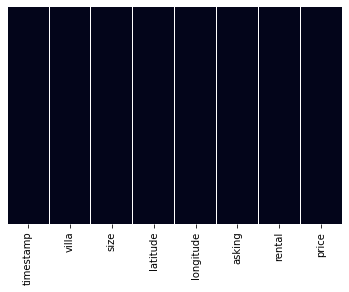

In [ ]:
sns.heatmap(dataset.isnull(),yticklabels=False,cbar=False)

In [ ]:
numeric_cols = list(dataset.select_dtypes(include=[np.number]))


print("Here are the %s numeric variables : \n %s" % (len(numeric_cols), numeric_cols))

Here are the 8 numeric variables : 
 ['timestamp', 'villa', 'size', 'latitude', 'longitude', 'asking', 'rental', 'price']


 **Correlation matrix**

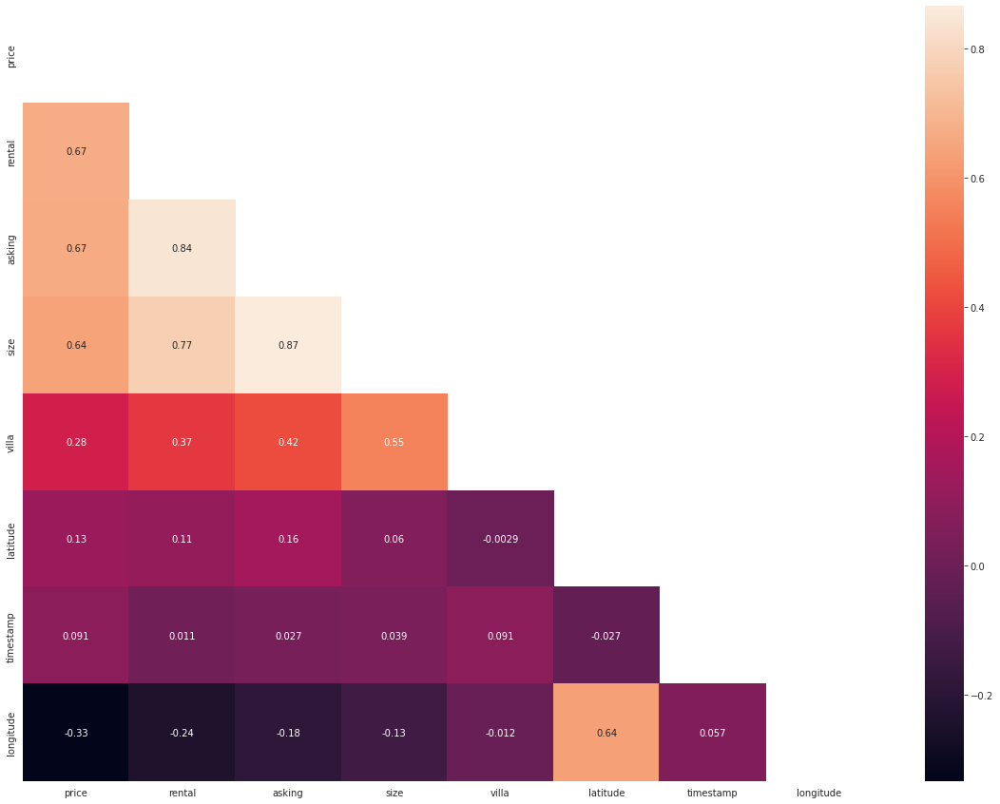

In [ ]:
numerical_values =dataset[list(dataset.select_dtypes(include=[np.number]))]
# Get the more correlated ariables by sorting in descending order for the SalePrice column
ix = numerical_values.corr().sort_values('price', ascending=False).index
df_sorted_by_correlation = numerical_values.loc[:, ix]
# take only the first 15 more correlated variables
fifteen_more_correlated = df_sorted_by_correlation.iloc[:, :20]
corr = fifteen_more_correlated.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    # display a correlation heatmap
    plt.subplots(figsize=(20,15))
    ax = sns.heatmap(corr, mask=mask, annot=True)

In [ ]:
corr, _ = pearsonr(dataset['price'], dataset['asking'])
corr

0.6675586967333874

In [ ]:
result = scipy.stats.pointbiserialr(dataset['asking'],dataset['price'])
result

PointbiserialrResult(correlation=0.6675586967333874, pvalue=0.0)

**T-test for villa and price**

In [ ]:
res = scipy.stats.ttest_ind(dataset['villa'],dataset['price'])
res

Ttest_indResult(statistic=-8089.889757798656, pvalue=0.0)

 **Some Statistical Overview on villa**

In [ ]:
 villa_yes = dataset[dataset['villa']==1]
 villa_yes.describe()

,timestamp,villa,size,latitude,longitude,asking,rental,price
count,7.112000e+03,7112.0,7112.000000,7112.000000,7112.000000,7.112000e+03,7.112000e+03,7112.000000
mean,1.455114e+09,1.0,4913.333661,25.099795,55.222494,5.965160e+06,2.845285e+05,15.052157
std,1.301179e+08,0.0,3219.041684,0.033969,0.062445,4.526618e+06,1.863581e+05,0.659542
min,1.077926e+09,1.0,3.000000,25.040341,55.158639,4.740750e+05,2.556500e+04,0.000000
25%,1.366632e+09,1.0,2868.000000,25.076429,55.175287,3.103854e+06,1.768330e+05,14.735135
50%,1.479686e+09,1.0,4135.500000,25.098315,55.206589,4.821860e+06,2.278300e+05,15.047746
75%,1.569888e+09,1.0,5753.000000,25.110915,55.243926,6.151270e+06,2.879705e+05,15.308415
max,1.632614e+09,1.0,44800.000000,25.305823,55.508141,6.765973e+07,1.250973e+06,19.296149


In [ ]:
 villa_no = dataset[dataset['villa']==0]
 villa_no.describe()

,timestamp,villa,size,latitude,longitude,asking,rental,price
count,2.332010e+05,233201.0,233201.000000,233201.000000,233201.000000,2.332010e+05,2.332010e+05,233201.000000
mean,1.391315e+09,0.0,1142.110192,25.100792,55.230342,1.336590e+06,8.035312e+04,13.686365
std,1.176552e+08,0.0,799.356584,0.059185,0.108718,1.542364e+06,8.317650e+04,0.782204
min,1.177891e+09,0.0,1.000000,24.861898,55.027290,2.124800e+05,1.582100e+04,0.000000
25%,1.296346e+09,0.0,698.000000,25.068737,55.143533,4.690430e+05,3.446600e+04,13.119383
50%,1.379894e+09,0.0,936.000000,25.088612,55.205824,8.899910e+05,5.771200e+04,13.652990
75%,1.472083e+09,0.0,1419.000000,25.161231,55.279462,1.717863e+06,1.033000e+05,14.220975
max,1.632614e+09,0.0,38025.000000,25.290727,55.441623,3.924946e+07,3.209766e+06,19.644456


**Histogram for villa to Check Distribution**

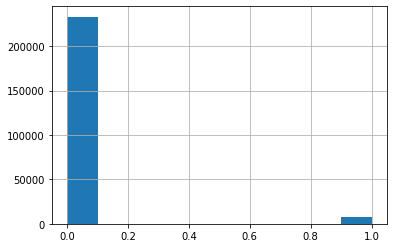

In [ ]:
dataset['villa'].hist()

**Asking vs Price**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


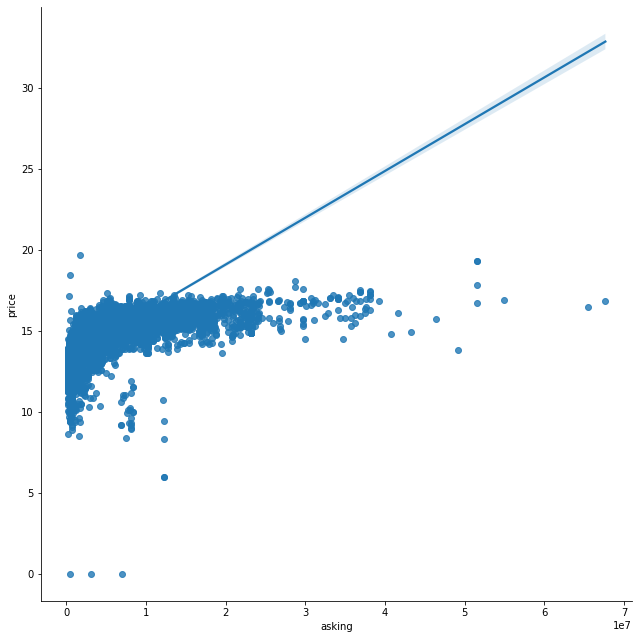

In [ ]:
sns.pairplot(data=dataset, x_vars=['asking'], y_vars=['price'], size=9, kind='reg')
plt.show()

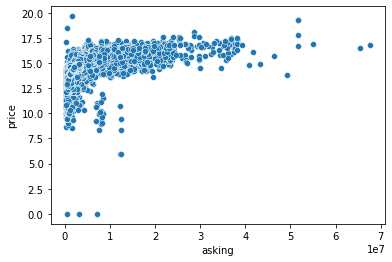

In [ ]:
sns.scatterplot(x=dataset['asking'], y=dataset['price'], data=dataset)
plt.show()


**Rental vs Price**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


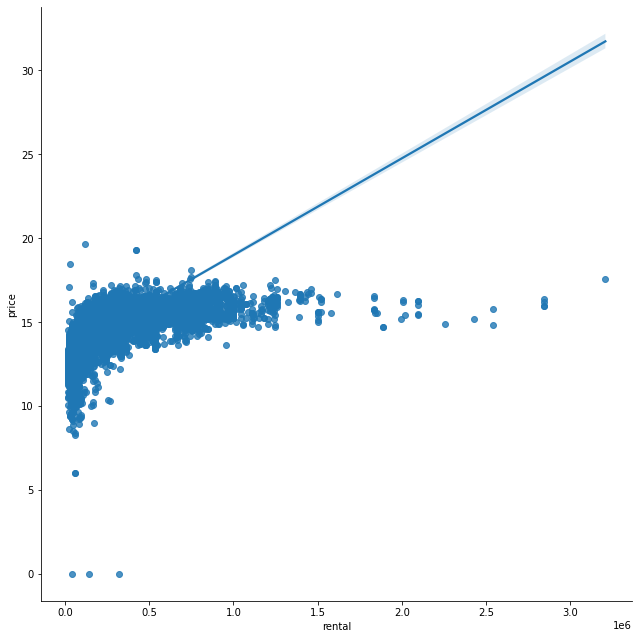

In [ ]:
sns.pairplot(data=dataset, x_vars=['rental'], y_vars=['price'], size=9, kind='reg')
plt.show()

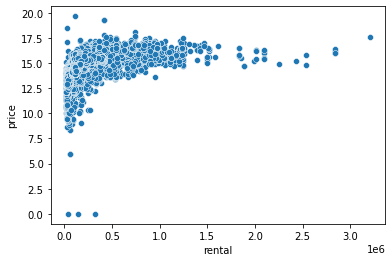

In [ ]:
sns.scatterplot(x=dataset['rental'], y=dataset['price'], data=dataset)
plt.show()

**Size vs Price**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


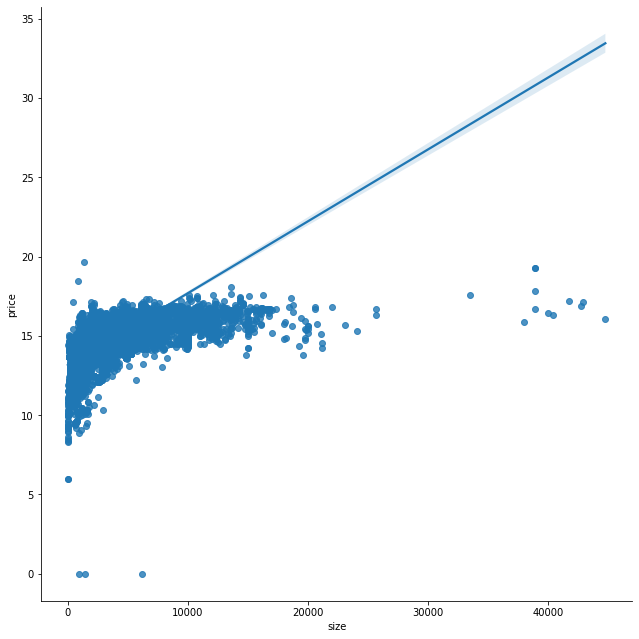

In [ ]:
sns.pairplot(data=dataset, x_vars=['size'], y_vars=['price'], size=9, kind='reg')
plt.show()

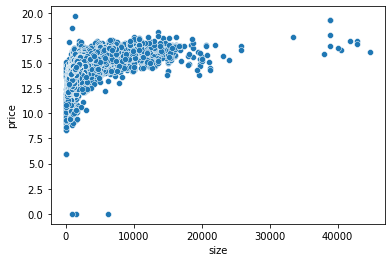

In [ ]:
sns.scatterplot(x=dataset['size'], y=dataset['price'], data=dataset)
plt.show()

**Villa vs Price**

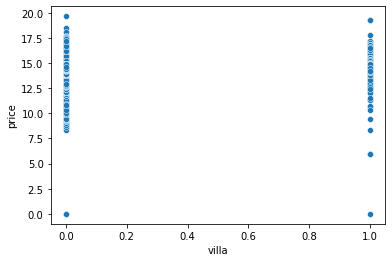

In [ ]:
sns.scatterplot(x=dataset['villa'], y=dataset['price'], data=dataset)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


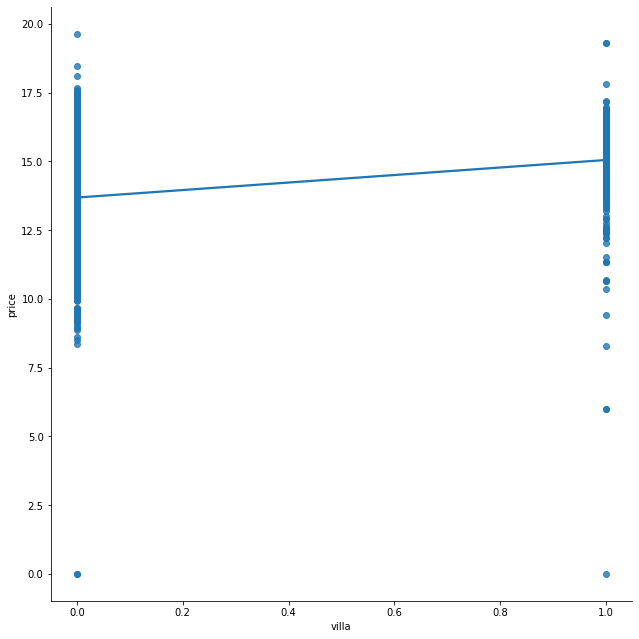

In [ ]:
sns.pairplot(data=dataset, x_vars=['villa'], y_vars=['price'], size=9, kind='reg')
plt.show()


**Timestamps vs Price**

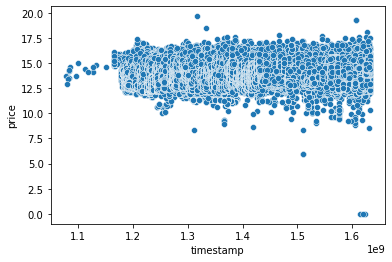

In [ ]:
sns.scatterplot(x=dataset['timestamp'], y=dataset['price'], data=dataset)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


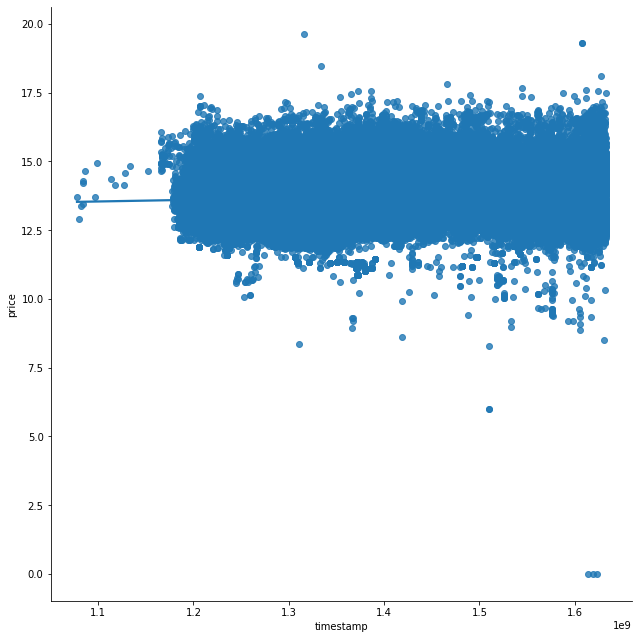

In [ ]:
sns.pairplot(data=dataset, x_vars=['timestamp'], y_vars=['price'], size=9, kind='reg')
plt.show()


**Latitude vs Price**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


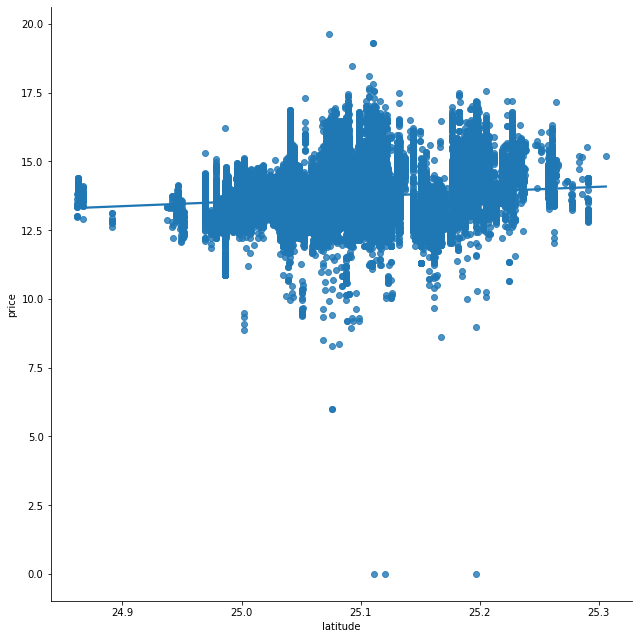

In [ ]:
sns.pairplot(data=dataset, x_vars=['latitude'], y_vars=['price'], size=9, kind='reg')
plt.show()

Text(0.5, 1.0, 'Latitude vs Price')

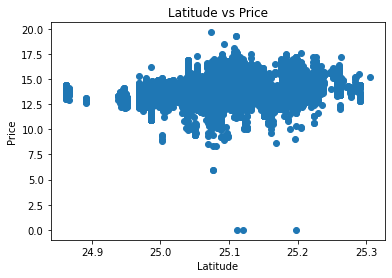

In [ ]:
plt.scatter(dataset.latitude,dataset.price)
plt.ylabel("Price")
plt.xlabel('Latitude')
plt.title("Latitude vs Price")

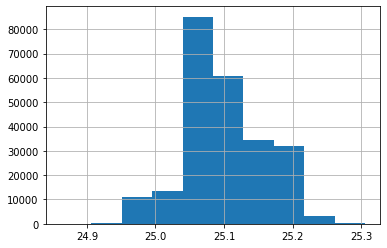

In [ ]:
dataset['latitude'].hist()

**Longitude vs Price**

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


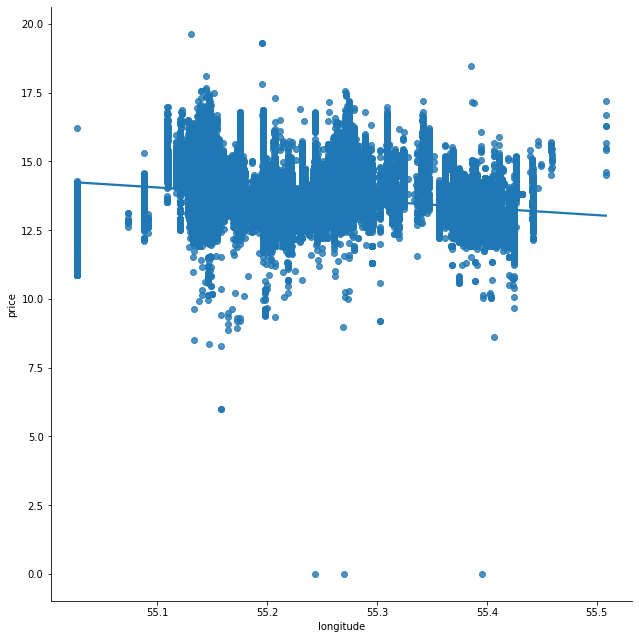

In [ ]:
sns.pairplot(data=dataset, x_vars=['longitude'], y_vars=['price'], size=9, kind='reg')
plt.show()

Text(0.5, 1.0, 'longitude vs Price')

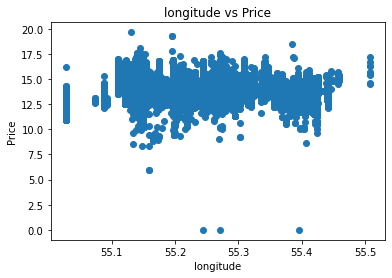

In [ ]:
plt.scatter(dataset.longitude,dataset.price)
plt.ylabel("Price")
plt.xlabel('longitude')
plt.title("longitude vs Price")

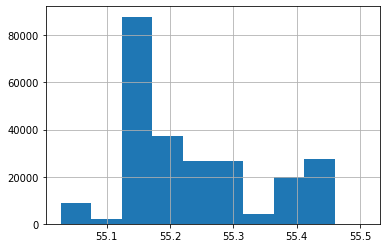

In [ ]:
dataset['longitude'].hist()

**Visualize on Map**

In [ ]:

import plotly.express as px


fig = px.scatter_mapbox(data_frame = dataset, lat=dataset.latitude, lon=dataset.longitude, 
                        zoom=10, height=500, hover_data=['price'])
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

**Features Selection**

In [ ]:
final_dataset = dataset
features = [ 'villa', 'size', 'latitude', 'longitude', 'asking', 'rental','timestamp']
target = final_dataset['price']
im_balance = final_dataset['villa']

In [ ]:
X = final_dataset[features]
y = target

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=im_balance, 
                                                    test_size=0.2)

**Accuracy matrices**

In [ ]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score




def print_evaluate(true, predicted):  

    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)

    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

   
    
def evaluate(true, predicted):

    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return  rmse, r2_square

**Model training and result evaluation**

**Linear Regression with Default Parameters**

In [ ]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X_train,y_train)

test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

Test set evaluation:
_____________________________________
RMSE: 0.5196903524116347
R2 Square 0.5955523625843677
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.5108699620651797
R2 Square 0.6035289893712013
__________________________________


**Linear Regression with Random Search**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
 'fit_intercept': [True, False],
 'normalize' : [True, False],
 'copy_X' : [True, False],
 
 }

pre_ln_inst = RandomizedSearchCV(lin_reg,
 param_distributions = param_dist,
 cv=3,
 n_iter = 10,
 n_jobs=-1)


best_model = pre_ln_inst.fit(X_train,y_train)

test_pre = best_model.predict(X_test)
train_pre = best_model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pre)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pre)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning:

The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.



Test set evaluation:
_____________________________________
RMSE: 0.5142099681801467
R2 Square 0.598748788429051
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.5123011647413274
R2 Square 0.602631087848283
__________________________________


**Random Forest regressor with Default Parameters**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
random_forest = RandomForestRegressor()
random_forest.fit(X_train,y_train)
test_pred_3= random_forest.predict(X_test)
train_pred_3 = random_forest.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred_3)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred_3)

Test set evaluation:
_____________________________________
RMSE: 0.2581001445522074
R2 Square 0.8990525784234609
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.1106385849633651
R2 Square 0.9814599796914102
__________________________________


**Random Forest with Random Search**

In [ ]:
rf = RandomForestRegressor()

from sklearn.model_selection import RandomizedSearchCV





n_estimators = [int(x) for x in np.linspace(start = 1, stop = 20, num = 20)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(10, 120, num = 12)]
min_samples_split = [2, 6, 10]
min_samples_leaf = [1, 3, 4]
bootstrap = [True, False]


random_grid = {'n_estimators': n_estimators,

'max_features': max_features,

'max_depth': max_depth,

'min_samples_split': min_samples_split,

'min_samples_leaf': min_samples_leaf,

'bootstrap': bootstrap}

rf_random = RandomizedSearchCV(estimator = rf,

param_distributions = random_grid,
               n_iter = 100, cv = 5, verbose=2, random_state=35, n_jobs = -1)
model = rf_random.fit(X_train,y_train)

# this prints the contents of the parameters in the random grid
print ('Random grid: ', random_grid, '\n')
# print the best parameters
print ('Best Parameters: ', rf_random.best_params_, ' \n')
predicted_test = model.predict(X_test)
predicted_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, predicted_test)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, predicted_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed: 25.5min finished


Random grid:  {'n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120], 'min_samples_split': [2, 6, 10], 'min_samples_leaf': [1, 3, 4], 'bootstrap': [True, False]} 

Best Parameters:  {'n_estimators': 19, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': True}  

Test set evaluation:
_____________________________________
RMSE: 0.30397090595276127
R2 Square 0.8604039472138201
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.27927697267556545
R2 Square 0.8817773863299847
__________________________________


In [ ]:
from sklearn.lda import LDA

ModuleNotFoundError: ignored

**Decision Tree with Default Parameters**

In [ ]:
from sklearn.tree import DecisionTreeRegressor
dc_tree = DecisionTreeRegressor()
dc_tree.fit(X_train,y_train)
test_pred_2= dc_tree.predict(X_test)
train_pred_2 = dc_tree.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred_2)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred_2)

Test set evaluation:
_____________________________________
RMSE: 0.32214367134744964
R2 Square 0.8424315370328448
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.2680332277650785
R2 Square 0.8912422015029748
__________________________________


**Decision Tree with Random Search**

In [ ]:
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV

# Setup the parameters and distributions to sample from: param_dist
param_dist={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }

# Instantiate a Decision Tree classifier: tree
tree = DecisionTreeRegressor()

# Instantiate the RandomizedSearchCV object: tree_cv
tree_cv = RandomizedSearchCV(tree, param_dist, cv=5)

# Fit it to the data
bst_mdl = tree_cv.fit(X_train,y_train)

# Print the tuned parameters and score
print("Tuned Decision Tree Parameters: {}".format(tree_cv.best_params_))
print("Best score is {}".format(tree_cv.best_score_))

pred = bst_mdl.predict(X_test)
pred_train = bst_mdl.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, pred_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: min_weight_fraction_leaf must in [0, 0.5]

  FitFailedWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: min_weight_fraction_leaf must in [0, 0.5]

  FitFailedWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: min_weight_fraction_leaf must in [0, 0.5]

  FitFailedWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on 

Tuned Decision Tree Parameters: {'splitter': 'best', 'min_weight_fraction_leaf': 0.2, 'min_samples_leaf': 9, 'max_leaf_nodes': 70, 'max_features': 'log2', 'max_depth': 12}
Best score is 0.6036965789864484
Test set evaluation:
_____________________________________
RMSE: 0.5307480851509211
R2 Square 0.5744153311967883
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.5323807234116419
R2 Square 0.5703894436097212
__________________________________


**AdaBoostRegressor with Default Parameters**

In [ ]:
from sklearn.ensemble import AdaBoostRegressor

ada = AdaBoostRegressor()
model = ada.fit(X_train,y_train)
prd_test = model.predict(X_test)
prd_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test,prd_test)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, prd_train)

Test set evaluation:
_____________________________________
RMSE: 0.6062362964059487
R2 Square 0.45156895505425
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.5939881016855675
R2 Square 0.46353751738640625
__________________________________


**AdaBoostRegressor with Random Search**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
 'n_estimators': [50, 100],
 'learning_rate' : [0.01,0.05,0.1,0.3,1],
 'loss' : ['linear', 'square', 'exponential']
 }

pre_gs_inst = RandomizedSearchCV(AdaBoostRegressor(),
 param_distributions = param_dist,
 cv=3,
 n_iter = 10,
 n_jobs=-1)

model = pre_gs_inst.fit(X_train, y_train)
# Print the tuned parameters and score
print("Tuned  Parameters: {}".format(pre_gs_inst.best_params_))
prd_test = model.predict(X_test)
prd_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test,prd_test)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, prd_train)


Tuned  Parameters: {'n_estimators': 50, 'loss': 'exponential', 'learning_rate': 0.1}
Test set evaluation:
_____________________________________
RMSE: 0.41350646023741094
R2 Square 0.7448457778313256
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.3931117487228643
R2 Square 0.7650281095775093
__________________________________


**GradientBoostingRegressor with Default Parameters**

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor()
model = gb.fit(X_train,y_train)
prd_test = model.predict(X_test)
prd_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test,prd_test)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, prd_train)


Test set evaluation:
_____________________________________
RMSE: 0.3211638597834807
R2 Square 0.8436952873520034
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.31547185558750457
R2 Square 0.8492635715618313
__________________________________


**GradientBoostingRegressor with Random Search**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
 'n_estimators': [50,75, 100,200],
 'learning_rate' : [0.01,0.05,0.1,0.3,1],
 'max_depth':[1,2,4,5,8],
 'subsample':[.5,.75,1]
 }
gb = GradientBoostingRegressor()
pre_gb_inst = RandomizedSearchCV(gb,
 param_distributions = param_dist,
 cv=3,
 n_iter = 10,
 n_jobs=-1)

model = pre_gb_inst.fit(X_train, y_train)
# Print the tuned parameters and score
print("Tuned  Parameters: {}".format(pre_gb_inst.best_params_))
prd_test = model.predict(X_test)
prd_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test,prd_test)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, prd_train)



Tuned  Parameters: {'subsample': 1, 'n_estimators': 75, 'max_depth': 5, 'learning_rate': 1}
Test set evaluation:
_____________________________________
RMSE: 0.2744712990126892
R2 Square 0.8858403547625305
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.24858383316791396
R2 Square 0.9064071350875443
__________________________________


**KNN Regressor with Default Parameters**

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train,y_train)
test_pred_6= knn.predict(X_test)
train_pred_6= knn.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred_6)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred_6)

Test set evaluation:
_____________________________________
RMSE: 0.3415077876526416
R2 Square 0.8237982059545655
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.31925910624862114
R2 Square 0.8455041253839797
__________________________________


**KNN Regressor with Grid Search**

In [ ]:
from sklearn.model_selection import  GridSearchCV
knn = KNeighborsRegressor()
grid_params = {
    'n_neighbors':[3,5,11,19],
    'weights':['uniform','distance'],
    'metric':['euclidean','manhattan']
}
gs = GridSearchCV(knn,grid_params,verbose=1,cv=3,n_jobs =-1)

model = gs.fit(X_train,y_train)
print('best params:',gs.best_params_)
print('best score:',gs.best_score_)

prd = model.predict(X_test)
prd_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, prd)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, prd_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:   44.7s finished


best params: {'metric': 'manhattan', 'n_neighbors': 19, 'weights': 'distance'}
best score: 0.8277384448206364
Test set evaluation:
_____________________________________
RMSE: 0.3301999118965672
R2 Square 0.8352736753015676
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.27012003259031275
R2 Square 0.8894028623658228
__________________________________


**XGB Regressor with Default Parameters**

In [ ]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.01,
                max_depth = 5, alpha = 10, n_estimators = 10)
xg_reg.fit(X_train,y_train)
preds = xg_reg.predict(X_test)
preds_train = xg_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, preds)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, preds_train)


[14:36:28] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Test set evaluation:
_____________________________________
RMSE: 11.982003774752549
R2 Square -215.9042226186418
__________________________________
Train set evaluation:
_____________________________________
RMSE: 11.988813372974423
R2 Square -216.8626087124938
__________________________________


**Regression with Neural Network**

In [ ]:
from keras.models import Sequential
from keras.layers import Dense
from tensorflow import keras
from tensorflow.keras import layers
from keras.callbacks import EarlyStopping
 
# create ANN model
model = keras.Sequential([
    layers.Dense(64, activation='relu', input_shape=[6]),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(120, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(120, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(120, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(120, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(120, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(1),
])
 
# Compiling the model
model.compile(loss='mean_squared_error', optimizer='adam')
es = EarlyStopping(monitor='loss')
 
# Fitting the ANN to the Training set
model.fit(X_train, y_train ,batch_size = 428, epochs = 100, verbose=2)

Epoch 1/250
450/450 - 9s - loss: 70.4237
Epoch 2/250
450/450 - 7s - loss: 2.4451
Epoch 3/250
450/450 - 6s - loss: 1.2659
Epoch 4/250
450/450 - 6s - loss: 0.7619
Epoch 5/250
450/450 - 6s - loss: 0.4902
Epoch 6/250
450/450 - 6s - loss: 0.3482
Epoch 7/250
450/450 - 6s - loss: 0.2778
Epoch 8/250
450/450 - 6s - loss: 0.2449
Epoch 9/250
450/450 - 7s - loss: 0.2314
Epoch 10/250
450/450 - 6s - loss: 0.2221
Epoch 11/250
450/450 - 7s - loss: 0.2167
Epoch 12/250
450/450 - 7s - loss: 0.2113
Epoch 13/250
450/450 - 6s - loss: 0.2083
Epoch 14/250
450/450 - 7s - loss: 0.2044
Epoch 15/250
450/450 - 7s - loss: 0.2021
Epoch 16/250
450/450 - 6s - loss: 0.1986
Epoch 17/250
450/450 - 6s - loss: 0.1962
Epoch 18/250
450/450 - 6s - loss: 0.1941
Epoch 19/250
450/450 - 6s - loss: 0.1922
Epoch 20/250
450/450 - 6s - loss: 0.1899
Epoch 21/250
450/450 - 6s - loss: 0.1867
Epoch 22/250
450/450 - 6s - loss: 0.1859
Epoch 23/250
450/450 - 6s - loss: 0.1837
Epoch 24/250
450/450 - 7s - loss: 0.1835
Epoch 25/250
450/450 - 6

In [ ]:
pred_test = model.predict(X_test)
pred_train = model.predict(X_train)
print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, pred_test)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, pred_train)

Test set evaluation:
_____________________________________
RMSE: 0.4988556422812152
R2 Square 0.6286461433262734
__________________________________
Train set evaluation:
_____________________________________
RMSE: 0.4830375980772231
R2 Square 0.6452309409340756
__________________________________
